# Model building script (previous iteration)

## Overview

The goal of this code was to use unsupervised machine learning approaches along with apriori knowledge to determine good quality and bad quality samples (`PASS` and `FAIL` here). It was reasoned that quality metrics, such as R-loop forming sequences enrichment, could be used to evenly divide these two groups. As you will see, this was not the case -- and, in fact, while good quality samples tend to cluster together, bad quality samples are much more chaotic. 

Here is the latest iteration of the code I used to parse these groups and develop quality models based on them. 

## Label assignment

The first task is to find a reasonable approach which allows us to assign `PASS` and `FAIL` labels to the samples in our dataset.

### Exploratory data analysis

In [203]:
.libPaths("/home/UTHSCSA/millerh1/miniconda3/envs/RSeqEnv/lib/R/library") # Specify the location of libraries for R 3.6.1
library(tidyverse)
library(ChIPpeakAnno)
library(repr)
library(factoextra)
library(FactoMineR)
library(plotly)

In [207]:
# Read in the dataset
rmap_samples <- suppressMessages(read_csv("../rmap_full_11_25.csv"))
rmap_samples

experiment,mode,control,paired_end,genome,strand_specific,moeity,ip_type,sample_name,read_length,⋯,EPIC2__total_peaks,reads_before,reads_after,percent_passing,gc_content,read_length_after_filter,reads_aligned,pct_aligned,duplicate_reads,pct_duplicated
<chr>,<chr>,<chr>,<lgl>,<chr>,<lgl>,<chr>,<chr>,<chr>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
"SRR393966,SRR891288,SRR891289",DRIVE,NA,FALSE,hg38,FALSE,RNA,RNaseH1,SRX113814_Ntera2_DNA,40.00,⋯,8314,30436981,30194723,99.2,0.405425,37,19369810,64.14965,7809444,25.863605
"SRR393965,SRR891287",DRIP,NA,FALSE,hg38,FALSE,DNA,S9.6,SRX113813_Ntera2_DNA,58.00,⋯,6750,81266480,68076488,83.8,0.412482,57,31977343,46.97267,11659764,17.127446
"SRR393964,SRR891286,SRR891290,SRR891285,SRR891291",DRIP,NA,FALSE,hg38,FALSE,DNA,S9.6,SRX113812_Ntera2_DNA,41.00,⋯,2989,58352422,46566240,79.8,0.408061,39,29144537,62.58727,9289493,19.948987
SRR3322169,DRIPc,NA,FALSE,mm10,TRUE,RNA,S9.6,SRX1674681_3T3_DRIPc-seq,100.00,⋯,39550,68378256,67936704,99.4,0.457881,100,25818326,38.00350,14806068,21.793916
SRR2075679,DRIPc,NA,FALSE,hg38,TRUE,RNA,S9.6,SRX1070676_NT2_DRIPc-seq_rep_1,50.00,⋯,56964,40206436,39064494,97.2,0.406872,50,15517570,39.72295,5392656,13.804495
SRR2075680,DRIPc,NA,FALSE,hg38,TRUE,RNA,S9.6,SRX1070677_NT2_DRIPc-seq_rep_2,50.00,⋯,57453,24476530,23509552,96.0,0.471714,49,15837135,67.36468,8433539,35.872819
SRR2075681,DRIP,NA,FALSE,hg38,FALSE,DNA,S9.6,SRX1070678_NT2_DRIP-seq_1,50.00,⋯,32939,60933938,58406404,95.9,0.473814,50,43579116,74.61359,8211270,14.058852
SRR2075682,DRIP,NA,FALSE,hg38,FALSE,DNA,S9.6,SRX1070679_NT2_DRIP-seq_2,50.00,⋯,38515,39783302,38399500,96.5,0.489002,50,31145639,81.10949,12019144,31.300262
SRR2075683,DRIP,NA,FALSE,hg38,FALSE,DNA,S9.6,SRX1070680_NT2_DRIP-seq_RNaseA,100.00,⋯,34756,43536380,40515300,93.1,0.470590,100,29803017,73.55991,5153648,12.720251


### Wrangle the data into a matrix with selected features & scale the features

In [208]:
# Select and wrangle data
rmap_features <- rmap_samples %>%
    mutate(has_control = ifelse(is.na(control), 0, 1)) %>%
    filter(mode_group == "DRIP") %>%
    filter(genome == "hg38") %>%
    dplyr::select(clean_name, corr_median, corr_skewness, corr_kurtosis, rlfs_pval,
                rlfs_median, rlfs_skewness, rlfs_kurtosis, `3UTR__Log2 Ratio (obs/exp)`, `Retroposon__Log2 Ratio (obs/exp)`,
                `miRNA__Log2 Ratio (obs/exp)`, `TTS__Log2 Ratio (obs/exp)`, `SINE__Log2 Ratio (obs/exp)`, 
                `LINE__Log2 Ratio (obs/exp)`, `tRNA__Log2 Ratio (obs/exp)`, `rRNA__Log2 Ratio (obs/exp)`,
                `Exon__Log2 Ratio (obs/exp)`, `Intron__Log2 Ratio (obs/exp)`, `Intergenic__Log2 Ratio (obs/exp)`,
                `Promoter__Log2 Ratio (obs/exp)`, `5UTR__Log2 Ratio (obs/exp)`,
                `Satellite__Log2 Ratio (obs/exp)`, MACS2__total_peaks, `MACS2__Percentage Peaks Overlapping`,
                EPIC2__total_peaks, `EPIC2__Percentage Peaks Overlapping`,
                reads_after, gc_content, pct_aligned,
                percent_passing, pct_duplicated) 
# Clean up the column names
colnames(rmap_features) <- gsub(colnames(rmap_features), pattern = "__L.+", replacement = "")
colnames(rmap_features) <- gsub(colnames(rmap_features), pattern = "__P.+", replacement = " % Overlap")
colnames(rmap_features) <- gsub(colnames(rmap_features), pattern = "rlfs_", replacement = "RLFS ")
colnames(rmap_features) <- gsub(colnames(rmap_features), pattern = "corr_", replacement = "Correlation ")
colnames(rmap_features) <- gsub(colnames(rmap_features), pattern = "gc_", replacement = "GC ")
# Transform into a matrix
rmap_featureMat <- rmap_features %>%
  column_to_rownames(var = "clean_name") %>%
  as.matrix()
# Clean up NAs and scale features
rmap_featureMat <- apply(rmap_featureMat, 1:2, as.numeric)
rmap_featureMat <- apply(rmap_featureMat, 1:2, function(x) {ifelse(is.na(x), 0, x)})
rmap_featureMat <- rmap_featureMat[which(rowSums(rmap_featureMat) != 0), which(colSums(rmap_featureMat) != 0)]
rmap_featuresscale <- scale(rmap_featureMat) # Scale the features using a standard scaler
rmap_featuresscale <- apply(rmap_featuresscale, 1:2, function(x) {ifelse(is.na(x), 0, x)})
rmap_featuresscale <- rmap_featuresscale[, which(colSums(rmap_featuresscale) != 0)]

### Assess feature correlations

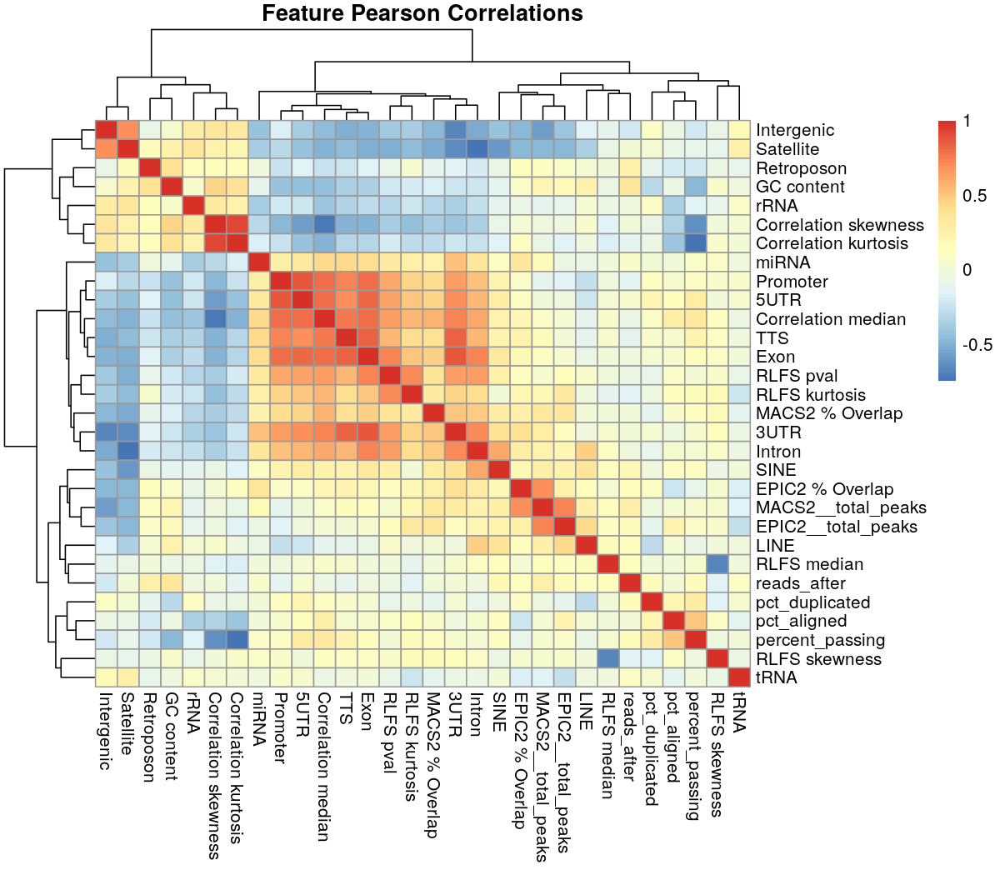

In [209]:
feat_cor <- cor(rmap_featureMat)
feat_cor <- apply(feat_cor, 1:2, function(x) {ifelse(is.na(x), 0, x)})
options(repr.plot.width=8, repr.plot.height=7, repr.plot.res = 150)
pheatmap::pheatmap(feat_cor, main = "Feature Pearson Correlations")

### Perform PCA to reduce dimensionality

In [210]:
res.pca = PCA(rmap_featuresscale, scale.unit = TRUE, ncp = 10, graph = TRUE)

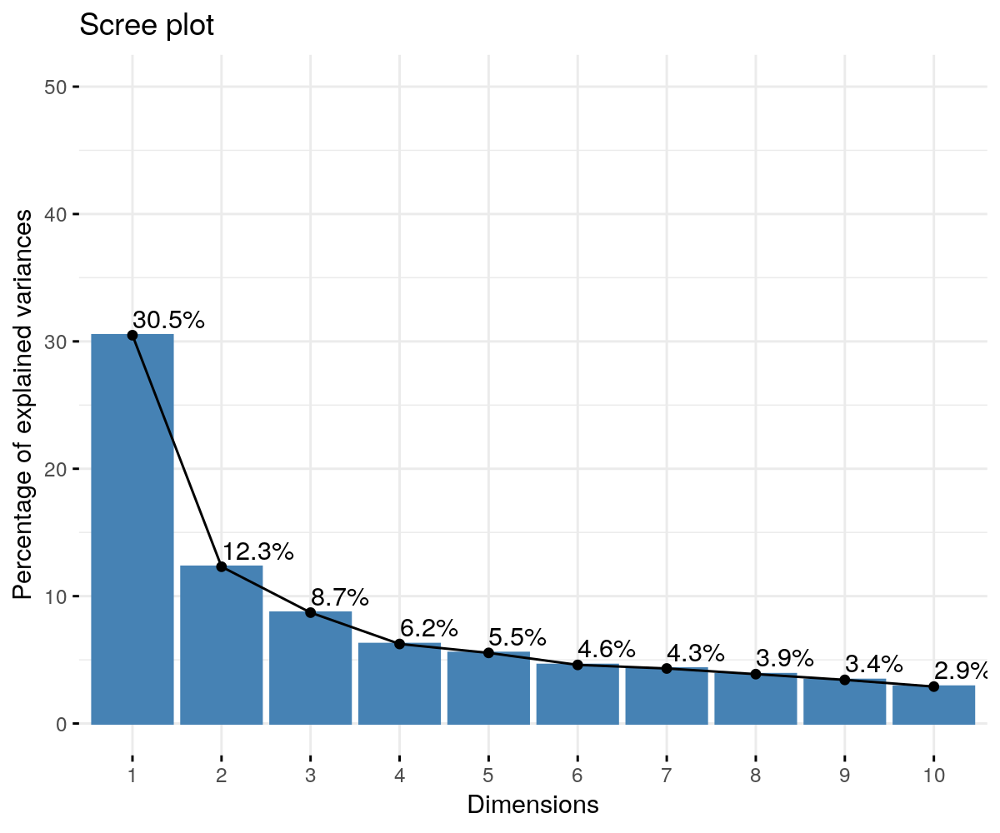

In [211]:
options(repr.plot.width=6, repr.plot.height=5, repr.plot.res = 200)
fviz_eig(res.pca, addlabels = TRUE, ylim = c(0, 50))

Contribution of each feature to each dimension

In [212]:
var <- get_pca_var(res.pca)
var$contrib

,Dim.1,Dim.2,Dim.3,Dim.4,Dim.5,Dim.6,Dim.7,Dim.8,Dim.9,Dim.10
Correlation median,8.809781e+00,1.673579e+00,1.907877e-02,0.04842423,1.112109e-01,0.202645858,2.679818e-03,0.044709384,0.085545645,0.678134723
Correlation skewness,4.871573e+00,3.769684e+00,7.546002e+00,0.45148012,2.317444e-01,3.622800792,9.690655e-05,0.010957393,7.831880681,0.233519423
Correlation kurtosis,2.890880e+00,2.110439e+00,1.733861e+01,0.24449217,8.457723e-04,2.306993066,4.843422e-01,0.003932468,9.096570610,0.273519532
RLFS pval,5.921422e+00,1.153570e-02,2.599639e+00,0.21033401,1.423880e+00,5.976897025,2.762301e-01,3.458126096,3.794446185,1.605012782
RLFS median,6.305556e-02,2.892924e-01,4.980260e+00,22.02574263,8.991218e-01,6.301913213,1.074354e+01,3.013882552,0.551497759,2.415731440
RLFS skewness,1.238851e-01,8.090365e-02,3.121221e+00,28.74313472,3.011382e-02,4.007374780,1.081746e+01,0.062197185,1.961096217,0.003199210
RLFS kurtosis,4.299189e+00,2.314625e-02,2.368305e-01,7.05211861,5.115110e-01,5.475780180,5.581263e+00,8.823755955,0.210926425,2.379954769
3UTR,8.231166e+00,3.281475e-01,2.831661e+00,0.79261287,4.947350e-01,0.087212732,3.359377e-01,0.650207146,0.020456428,0.003986259
Retroposon,5.005994e-01,2.854035e+00,9.025321e-02,0.01471640,1.016192e+01,16.941006224,4.518923e-01,7.952795921,0.429851272,4.646454896
miRNA,2.791014e+00,1.265721e-01,7.192352e-01,0.06239016,7.069001e+00,0.209092270,8.876711e-01,20.041048526,0.127013599,14.689324471


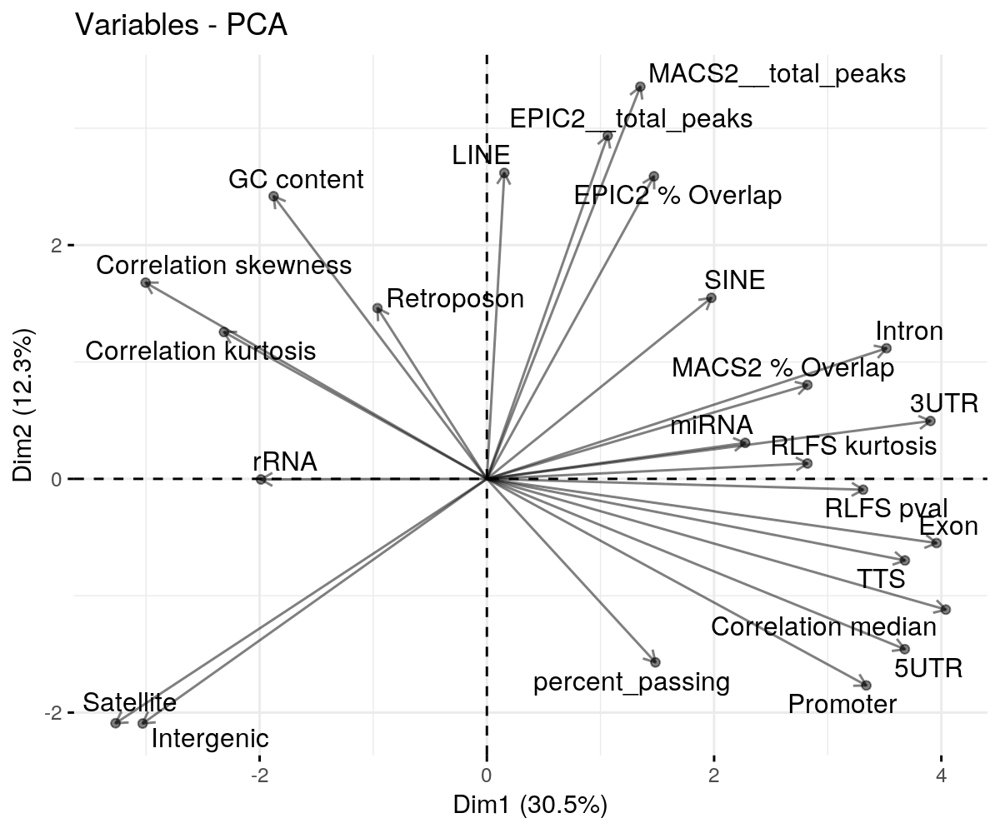

In [213]:
fviz_pca_var(res.pca, col.var="black", alpha.var = .5, geom = c('point', 'arrow', 'text'),
                   select.var = list(cos2 = .15), 
                   repel = TRUE, scale. = 4.5) 

### Use PCA results for distance matrix

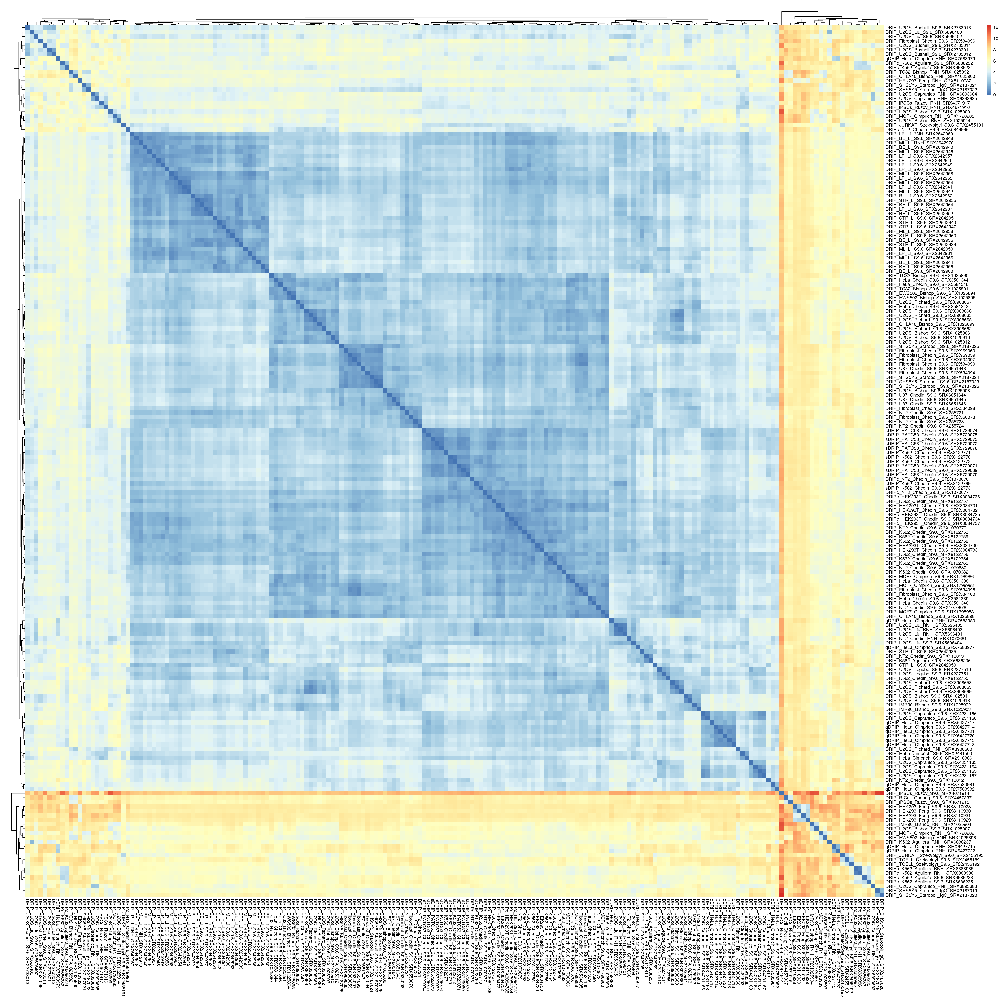

In [215]:
pcdata = res.pca$svd$U
pcadist = dist(pcdata)  # Get sample-sample distance in PCA space
res.dist = as.matrix(pcadist)
colnames(res.dist) = rownames(res.dist) = rownames(rmap_featuresscale)
options(repr.plot.width=30, repr.plot.height=30, repr.plot.res = 200)
out = pheatmap::pheatmap(res.dist, show_rownames = TRUE, show_colnames = TRUE)

From this, we can see that three main clusters are formed:

1. Very bad samples that are very different from everything else.
2. Medium-bad samples that sometimes are similar to other samples.
3. A mix of good and some noisy samples which cannot be easily distinguished yet. 

#### Labeling the clusters and adding to PCA

In [216]:
# Get clustering results
hc = hclust(pcadist, method = "complete")
dend <- as.dendrogram(out$tree_row)
# Plot clustering
options(repr.plot.width=60, repr.plot.height=10, repr.plot.res = 300)
par(mar = c(20, 5, 5,5))
plot(dend,  ylab = "Height", 
     horiz = F)

Cut the tree at height = 35

In [217]:
clusts = cutree(out$tree_row, h = 35)

In [218]:
table(clusts)

clusts
  1   2   3   4 
149  23  24   1 

In [219]:
rmap_feature_clust = rmap_features %>%
    mutate(cluster = as.factor(clusts)) %>%
    mutate(PC1 = pcdata[,1]) %>%
    mutate(PC2 = pcdata[,2])

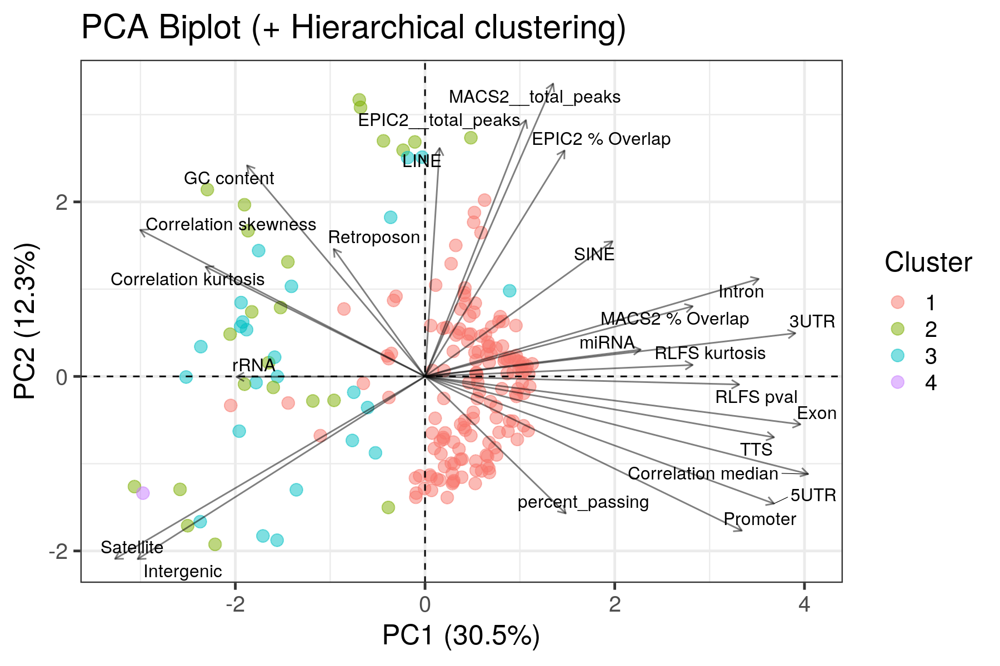

In [220]:
options(repr.plot.width=9, repr.plot.height=6, repr.plot.res = 200)
gg <- fviz_pca_var(res.pca, col.var="black", alpha.var = .5, 
                   select.var = list(cos2 = .15), 
                   repel = TRUE, scale. = 4.5) +
  geom_point(data = rmap_feature_clust, 
             mapping = aes(x = PC1, y = PC2, color = cluster),
             alpha = .5, size = 3.5) +
  theme_bw(base_size = 18)
gg$layers <- rev(gg$layers)
gg$labels$x <- gsub(gg$labels$x, pattern = "Dim1", replacement = "PC1")
gg$labels$y <- gsub(gg$labels$y, pattern = "Dim2", replacement = "PC2")
biplt <- gg + labs(title = "PCA Biplot (+ Hierarchical clustering)", color = "Cluster") 
biplt

#### Create a rank plot for the distance matrix with cluster and condition annotations

In [221]:
resMat = as.matrix(res.dist)
rmap_feature_clust$median_dist = matrixStats::rowMedians(resMat)

In [222]:
options(repr.plot.width=5, repr.plot.height=5, repr.plot.res = 300)
plt = rmap_feature_clust %>%
    arrange(median_dist) %>%
    ggplot(aes(x = seq(clean_name), y = median_dist, color = cluster,
                                     label = clean_name)) +
    geom_point() +
    xlab("Rank") +
    ylab("Median Distance from Other Samples") + 
    labs(title="Elbow plot of median sample-level distance (+ Clusters)") +
    theme_bw()
ggplotly(plt, width = 5, height = 5)

HTML widgets cannot be represented in plain text (need html)

In [223]:
plt = rmap_feature_clust %>%
    inner_join(rmap_samples[,c("clean_name", "Condition")], by = "clean_name") %>%
    arrange(median_dist) %>%
    ggplot(aes(x = seq(clean_name), y = median_dist, color = factor(Condition, levels = c("S9.6", "RNH", "IgG")),
                                     label = clean_name)) +
    geom_point() +
    xlab("Rank") +
    ylab("Median Distance from Other Samples") + 
    labs(title="Elbow plot of median sample-level distance (+ Condition)") +
    scale_color_manual(values = c("skyblue", "goldenrod", "firebrick")) +
    theme_bw()
ggplotly(plt, width = 5, height = 5)

HTML widgets cannot be represented in plain text (need html)

### Assigning labels
From the clustering analysis, we can see clear groups forming. This allows us to assign PASS/FAIL labels to the samples in our dataset. 

Cluster 1: These samples all seem to be pretty consistently high quality. We will train the model using the cluster 1 samples which are not RNaseH1 treated or IgG immunoprecipitation as RNaseH1 and IgG samples should not produce R-Loop mapping signal. 

Clusters 2-4: These seem to be the poorer quality samples which contain almost all the RNaseH1 samples and many of the ones which we're already demonstrated are of poor quality. However, to be fair, we should only select RNaseH1 or IgG samples from cluster 2-4 as our "FAIL" label as RNaseH1 and IgG should not be mapping any true R-loop signal. Also, we don't want to upset people too much and it gives us an apriori justification for choosing our labels. 

In [224]:
rmap_feature_labels = rmap_feature_clust %>%
    inner_join(rmap_samples[,c("clean_name", "Condition")], by = "clean_name") %>%
    mutate(label = ifelse(cluster == 1 & Condition == "S9.6", "PASS", 
                         ifelse(cluster %in% 2:4 & Condition != "S9.6", "FAIL", NA))) %>%
    filter(! is.na(label))

#### How do the labels compare in previous plots?

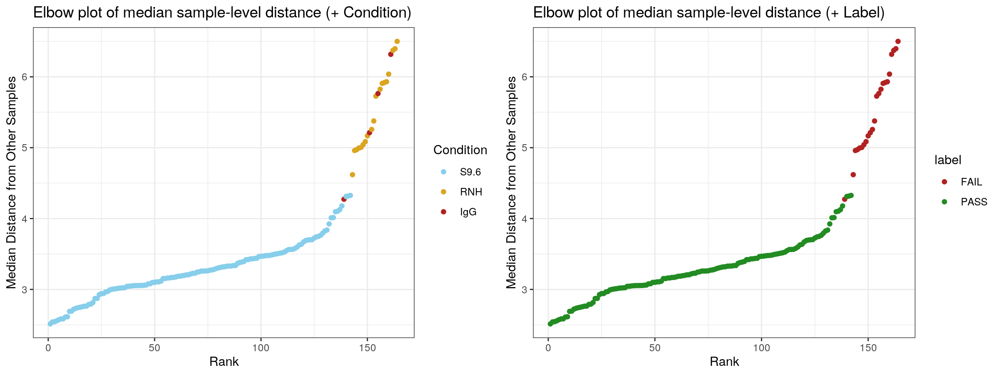

In [225]:
options(repr.plot.width=12, repr.plot.height=4.5, repr.plot.res = 200)
plt1 = rmap_feature_labels %>% 
    arrange(median_dist) %>%
    mutate(Condition = factor(Condition, levels = c("S9.6", "RNH", "IgG"))) %>%
    ggplot(aes(x = seq(clean_name), y = median_dist, color = Condition,
                                     label = clean_name)) +
    geom_point() +
    xlab("Rank") +
    ylab("Median Distance from Other Samples") + 
    labs(title="Elbow plot of median sample-level distance (+ Condition)") +
    scale_color_manual(values = c("skyblue", "goldenrod", "firebrick")) +
    theme_bw()
plt2 = rmap_feature_labels %>% 
    arrange(median_dist) %>%
    mutate(Condition = factor(Condition, levels = c("S9.6", "RNH", "IgG"))) %>%
    ggplot(aes(x = seq(clean_name), y = median_dist, color = label,
                                     label = clean_name)) +
    geom_point() +
    xlab("Rank") +
    ylab("Median Distance from Other Samples") + 
    labs(title="Elbow plot of median sample-level distance (+ Label)") +
    scale_color_manual(values = rev(c("forestgreen", "firebrick"))) +
    theme_bw()
ggpubr::ggarrange(plt1, plt2)

## Building the scoring models

This part will entail building the scoring models to use with RSeq

1. The classifier (using XGBoost)
2. The Linear Model (using linear regression)

### Preliminary: setting testing and training sets

In [226]:
clust_lab <- ifelse(rmap_feature_labels$label == "PASS", 1, 0)
smp_size <- floor(.75 * length(clust_lab))
set.seed(42)
train_ind <- sample(seq_len(length(clust_lab)), size = smp_size)
rmap_features_model = rmap_features %>% column_to_rownames(var = "clean_name") %>% as.matrix()
rmap_features_model = rmap_features_model[rmap_feature_labels$clean_name,]
train_x <- rmap_features_model[train_ind,]
train_y <- clust_lab[train_ind]
test_x <- rmap_features_model[-train_ind,]
test_y <- clust_lab[-train_ind]

#### XGBoost

In [227]:
library(xgboost)
set.seed(42)
dtrain <- xgb.DMatrix(data = train_x, label = train_y)
cv <- xgb.cv(data = dtrain, nrounds = 10, nthread = 2, nfold = 5,
             metrics = list('error'),
             max_depth = 5, eta = 1, objective = "binary:logistic")
cv

[1]	train-error:0.024387+0.004958	test-error:0.065667+0.042447 
[2]	train-error:0.008143+0.004071	test-error:0.049000+0.030579 
[3]	train-error:0.002020+0.004040	test-error:0.057667+0.042760 
[4]	train-error:0.000000+0.000000	test-error:0.049000+0.030579 
[5]	train-error:0.002041+0.004082	test-error:0.049000+0.030579 
[6]	train-error:0.002020+0.004040	test-error:0.065667+0.042447 
[7]	train-error:0.002020+0.004040	test-error:0.057333+0.033025 
[8]	train-error:0.000000+0.000000	test-error:0.049000+0.030579 
[9]	train-error:0.000000+0.000000	test-error:0.049000+0.030579 
[10]	train-error:0.000000+0.000000	test-error:0.049000+0.030579 


##### xgb.cv 5-folds
 iter train_error_mean train_error_std test_error_mean test_error_std
    1        0.0243866     0.004958403       0.0656666     0.04244733
    2        0.0081426     0.004071495       0.0490000     0.03057950
    3        0.0020202     0.004040400       0.0576666     0.04276027
    4        0.0000000     0.000000000       0.0490000     0.03057950
    5        0.0020408     0.004081600       0.0490000     0.03057950
    6        0.0020202     0.004040400       0.0656666     0.04244733
    7        0.0020202     0.004040400       0.0573332     0.03302514
    8        0.0000000     0.000000000       0.0490000     0.03057950
    9        0.0000000     0.000000000       0.0490000     0.03057950
   10        0.0000000     0.000000000       0.0490000     0.03057950

In [228]:
# Good -- train model on train data
bst <- xgboost(data = train_x, label = train_y, max.depth = 5,
               eta = 1, nthread = 2, nrounds = 6, objective = "binary:logistic")
bst

[1]	train-error:0.032520 
[2]	train-error:0.016260 
[3]	train-error:0.000000 
[4]	train-error:0.000000 
[5]	train-error:0.000000 
[6]	train-error:0.000000 


##### xgb.Booster
raw: 4.7 Kb 
call:
  xgb.train(params = params, data = dtrain, nrounds = nrounds, 
    watchlist = watchlist, verbose = verbose, print_every_n = print_every_n, 
    early_stopping_rounds = early_stopping_rounds, maximize = maximize, 
    save_period = save_period, save_name = save_name, xgb_model = xgb_model, 
    callbacks = callbacks, max.depth = 5, eta = 1, nthread = 2, 
    objective = "binary:logistic")
params (as set within xgb.train):
  max_depth = "5", eta = "1", nthread = "2", objective = "binary:logistic", validate_parameters = "TRUE"
xgb.attributes:
  niter
callbacks:
  cb.print.evaluation(period = print_every_n)
  cb.evaluation.log()
# of features: 30 
niter: 6
nfeatures : 30 
evaluation_log:
    iter train_error
       1     0.03252
       2     0.01626
---                 
       5     0.00000
       6     0.00000

In [229]:
pred <- predict(bst, test_x)
prediction <- as.numeric(pred > .50)
all(test_y == prediction)  # 100% accurate on the testing data

[1] TRUE

##### Feature importance

In [230]:
importance_matrix <- xgb.importance(model = bst)
print(importance_matrix)

                 Feature        Gain      Cover  Frequency
 1:               Intron 0.627904407 0.24048747 0.08333333
 2:   Correlation median 0.128582251 0.12024538 0.08333333
 3:                 3UTR 0.056610888 0.06356371 0.08333333
 4:                 Exon 0.055142463 0.23078453 0.16666667
 5:                 SINE 0.031939721 0.10539993 0.08333333
 6:            RLFS pval 0.030001559 0.03708589 0.08333333
 7: Correlation kurtosis 0.028978724 0.03519329 0.08333333
 8:      percent_passing 0.023743607 0.02536706 0.08333333
 9:                 LINE 0.008500300 0.01935779 0.08333333
10:           Retroposon 0.005420811 0.02811373 0.08333333
11: Correlation skewness 0.003175270 0.09440123 0.08333333


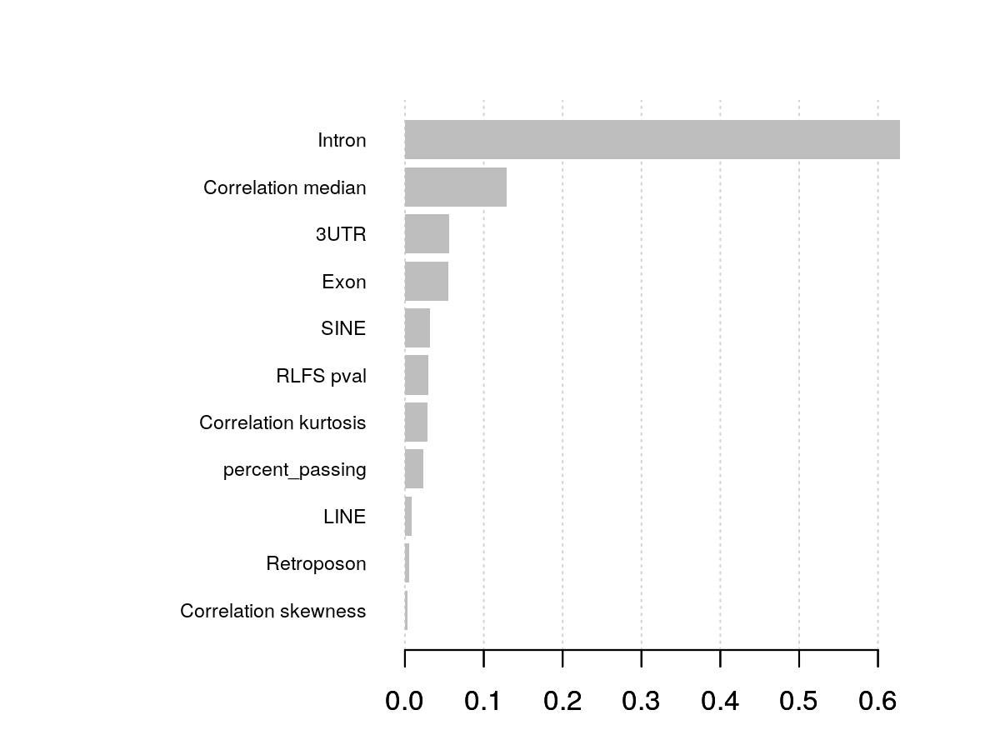

In [231]:
options(repr.plot.width=6, repr.plot.height=4.5, repr.plot.res = 200)
par(mar = c(3, 12, 3, 3))
xgb.plot.importance(importance_matrix = importance_matrix, left_margin = NULL)

On the data thus far, the model has performed perfectly... But this is a very small dataset... We cannot ignore the possibility of overfitting! A good test will be to see how this performs on the genomic input samples and on the experimental samples which we already know aren't very good (e.g., S9.6 samples that ended up in cluster 2-4).

#### Linear model

In [232]:
## Linear Regression for scoring ##
train_x2 <- as.data.frame(train_x)
colnames(train_x2) <- gsub(colnames(train_x2), pattern = " |\\(|\\)|\\/", replacement = "_")
colnames(train_x2) <- gsub(colnames(train_x2), pattern = "^([0-9]+)", replacement = "d\\1")
test_x2 <- as.data.frame(test_x)
colnames(test_x2) <- gsub(colnames(test_x2), pattern = " |\\(|\\)|\\/", replacement = "_")
colnames(test_x2) <- gsub(colnames(test_x2), pattern = "^([0-9]+)", replacement = "d\\1")
library(caret)
train.control <- trainControl(method = "cv", number = 5)

In [233]:
# Train the model -- good R2
train_x2$train_y <- train_y
model <- train(form = train_y ~ 
                 Correlation_median + 
                 Intron +
                 d3UTR + 
                 Exon + 
                 SINE + 
                 RLFS_pval +
                 Correlation_kurtosis +
                 percent_passing, 
               data = train_x2, method = "lm",
               trControl = train.control, na.action = na.pass)

Warning message in train.default(x, y, weights = w, ...):
"You are trying to do regression and your outcome only has two possible values Are you trying to do classification? If so, use a 2 level factor as your outcome column."


In [234]:
model

Linear Regression 

123 samples
  8 predictor

No pre-processing
Resampling: Cross-Validated (5 fold) 
Summary of sample sizes: 98, 99, 99, 98, 98 
Resampling results:

  RMSE       Rsquared   MAE      
  0.1850864  0.7414072  0.1074706

Tuning parameter 'intercept' was held constant at a value of TRUE

In [235]:
summary(model)


Call:
lm(formula = .outcome ~ ., data = dat)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.78813 -0.03612  0.01211  0.07939  0.29812 

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)          -6.247e-01  2.031e-01  -3.075  0.00265 ** 
Correlation_median    5.056e-01  1.398e-01   3.616  0.00045 ***
Intron                6.113e-05  4.759e-02   0.001  0.99898    
d3UTR                 1.667e-02  3.635e-02   0.459  0.64735    
Exon                  4.006e-02  4.386e-02   0.913  0.36312    
SINE                  5.110e-02  2.595e-02   1.970  0.05136 .  
RLFS_pval             2.168e-01  3.539e-02   6.125 1.38e-08 ***
Correlation_kurtosis  9.797e-03  4.071e-03   2.407  0.01773 *  
percent_passing       5.848e-03  2.044e-03   2.861  0.00505 ** 
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.1639 on 112 degrees of freedom
  (2 observations deleted due to missingness)
Multiple R-squared:  0.

In [236]:
# Test model -- good predictions 
lmpred <- predict(model, newdata = test_x2)
prediction <- as.numeric(lmpred > .50)
all(test_y == prediction)  # 100% accurate on the testing data

[1] TRUE

### Save models

In [237]:
# Save lm model 
lmfit <- model$finalModel
save(lmfit, file = "lm_DRIP_group_HS_nonbinary_01_26_2021.rda")

In [238]:
# Save XGBoost model
xgb.save(bst, fname = "xgb_DRIP_group_HS_binary_01_26_2021.model")

[1] TRUE

### Test models on full dataset

It is now worthwhile to test our models on the full dataset to see where they overlap with the results we got from the PCA and distance calculations.

In [239]:
rmap_features_all = rmap_features %>% column_to_rownames(var = "clean_name") %>% as.matrix()

In [240]:
verdict = predict(bst, rmap_features_all)
verdict = as.numeric(verdict > .50)

In [241]:
rmap_features_alldf <- as.data.frame(rmap_features_all)
colnames(rmap_features_alldf) <- gsub(colnames(rmap_features_alldf), pattern = " |\\(|\\)|\\/", replacement = "_")
colnames(rmap_features_alldf) <- gsub(colnames(rmap_features_alldf), pattern = "^([0-9]+)", replacement = "d\\1")
qual_score = predict(lmfit, rmap_features_alldf)

In [242]:
rmap_features_scores = rmap_features %>%
    mutate(verdict = verdict) %>%
    mutate(qual_score = qual_score) %>%
    inner_join(rmap_feature_clust[, c("clean_name",colnames(rmap_feature_clust)[which(! colnames(rmap_feature_clust) %in% colnames(rmap_features))])]) %>%
    inner_join(rmap_samples[,c("clean_name", "Condition")], by = "clean_name") %>%
    mutate(verdict = factor(verdict, labels = rev(c("PASS", "FAIL"))))

Joining, by = "clean_name"



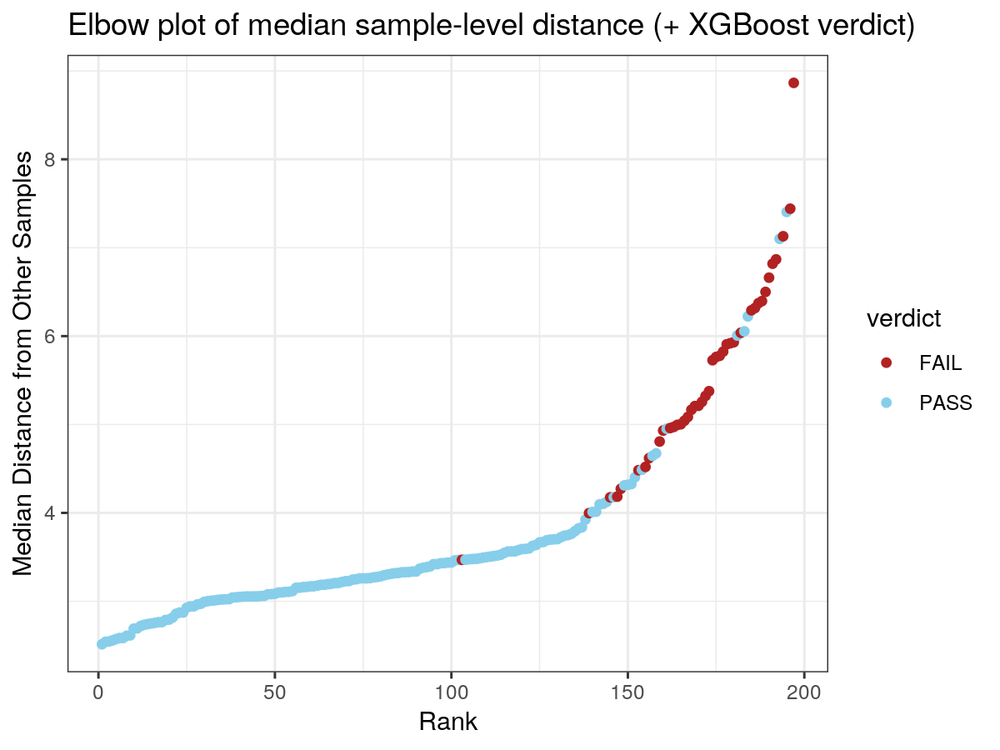

In [243]:
rmap_features_scores %>%
    arrange(median_dist) %>%
    ggplot(aes(x = seq(clean_name), y = median_dist, color = verdict,
                                     label = clean_name)) +
    geom_point() +
    xlab("Rank") +
    ylab("Median Distance from Other Samples") + 
    labs(title="Elbow plot of median sample-level distance (+ XGBoost verdict)") +
    scale_color_manual(values = rev(c("skyblue", "firebrick"))) +
    theme_bw()

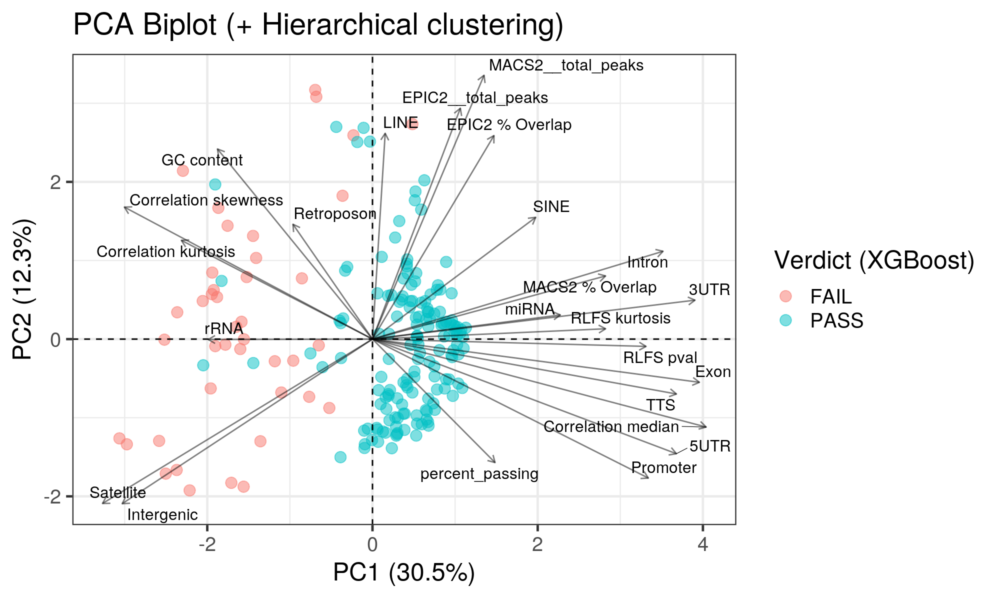

In [244]:
options(repr.plot.width=10, repr.plot.height=6, repr.plot.res = 200)
gg <- fviz_pca_var(res.pca, col.var="black", alpha.var = .5, 
                   select.var = list(cos2 = .15), 
                   repel = TRUE, scale. = 4.5) +
  geom_point(data = rmap_features_scores, 
             mapping = aes(x = PC1, y = PC2, color = verdict),
             alpha = .5, size = 3.5) +
  theme_bw(base_size = 18)
gg$layers <- rev(gg$layers)
gg$labels$x <- gsub(gg$labels$x, pattern = "Dim1", replacement = "PC1")
gg$labels$y <- gsub(gg$labels$y, pattern = "Dim2", replacement = "PC2")
biplt <- gg + labs(title = "PCA Biplot (+ Hierarchical clustering)", color = "Verdict (XGBoost)") 
biplt

## Ideas for improving this

Part of the limitation of this approach is the we are only training on RNH and IgG as the negative control. We're not training the model to recognize low quality samples which are S9.6. However, we have to devise an very defensible method for saying which S9.6 samples are actually low quality -- as this will be immediately challenged. Three potential methods:

1. Samples which are PC1 < 0 -- we already know that PC1 < 0 includes all the features which we know are low quality markers. Therefore, samples with PC1 < 0 should be considered possible low quality samples, even if they are S9.6
2. Samples which inter-sample-distance > 4. It is logical to argue that samples which are very different from everything else are probably not good quality... 
3. Sample which cluster into low-quality clusters. Clusters 2-4 are definitively low quality clusters. We can demonstrate that by the fact that they are typically PC1 < 0, they have samples with a large euclidean distance from everything else, and because they contain the vast majority of RNH and IgG samples. 

Perhaps we could try devising a system where S9.6 samples which meet all three criteria are labeled as FAIL and then we can train on them. 

We could also try including the genomic input samples as another negative control. However, this will probably not be the most relevant, considering that input samples tend to look quite different from DRIP-Seq. RNH is probably the best control. 